# **Analyse Datenempfang der tinkerforge-Sensoren**
___

In [1]:
import datetime as dt
import os

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

#import src.update_databases as update
import src.utilities as ut
import src.style as style
import src.sensor_reader as sr
import src.project_definitions as eb
style.set_rc_eb_standard()

import warnings
warnings.filterwarnings('ignore')

ex = False

# Moline Sensoren

In [28]:
EM = pd.concat({bui: sr.load_energy_data(bui) for bui in eb.buid}, axis=1)

In [30]:
## preparing data
timemax = max([EM.index.max().date() for bui in eb.buid])
timemax

datetime.date(2022, 2, 13)

In [86]:
EM.drop(labels='HQ',level=2,axis=1).droplevel(level=2,axis=1).resample('D').count()

MH                                                       \
              N         O         S      KWZ-Gesamt_W_VW OG-Ost_H_VW   
              H    W    H    W    H    W               W           H   
Datetime                                                               
2021-09-02  134  249  240  212  123  215              20          14   
2021-09-03  128  260  237  215  131  204              35          24   
2021-09-04  151  221  257  201  114  262              35           0   
2021-09-05  162  252  211  191  109  242              13           0   
2021-09-06  155  241  236  227  114  222              18          36   
...         ...  ...  ...  ...  ...  ...             ...         ...   
2022-02-09   94  225  203  204   92  193             227          31   
2022-02-10   36   79   95   89   58  118             112          15   
2022-02-11   55  123  151  156   90  176             196          41   
2022-02-12   83  226  202  201  131  182             204           0   
2022-02-13   74  197  193  216  109  186             217           0   

                             MW  ...                                  LB       \
           WMZ-Gesamt_H_VW    N  ... KWZ-Gesamt_W_VW WMZ-Gesamt_H_VW   N        
                         H    H  ...               W               H   H    W   
Datetime                         ...                                            
2021-09-02             236   62  ...             140             446  33  166   
2021-09-03             225   79  ...              54             482  53  170   
2021-09-04             201  271  ...              87             354   0  146   
2021-09-05             276  103  ...              96             458   0  122   
2021-09-06             207  110  ...              46             462  54  131   
...                    ...  ...  ...             ...             ...  ..  ...   
2022-02-09             193  204  ...             174             174  62  233   
2022-02-10             845  106  ...             817             109  12  115   
2022-02-11             461  178  ...             432             153  58  185   
2022-02-12             239  208  ...             163             197   0  247   
2022-02-13             196  210  ...             147             207   0  213   

                                                                
              O         S      KWZ-Gesamt_W_VW WMZ-Gesamt_H_VW  
              H    W    H    W               W               H  
Datetime                                                        
2021-09-02  246  107  276  278              17             341  
2021-09-03  267   81  301  270              39             275  
2021-09-04  317   71  291  310              48             272  
2021-09-05  248   98  283  311              33             363  
2021-09-06  247   98  235  285              14             391  
...         ...  ...  ...  ...             ...             ...  
2022-02-09  155   56  148  317             149             331  
2022-02-10  101   42   85  102              79             922  
2022-02-11  174   76  110  205             102             539  
2022-02-12  190   62  124  297             186             359  
2022-02-13  207   57  130  285             167             352  

[165 rows x 25 columns]

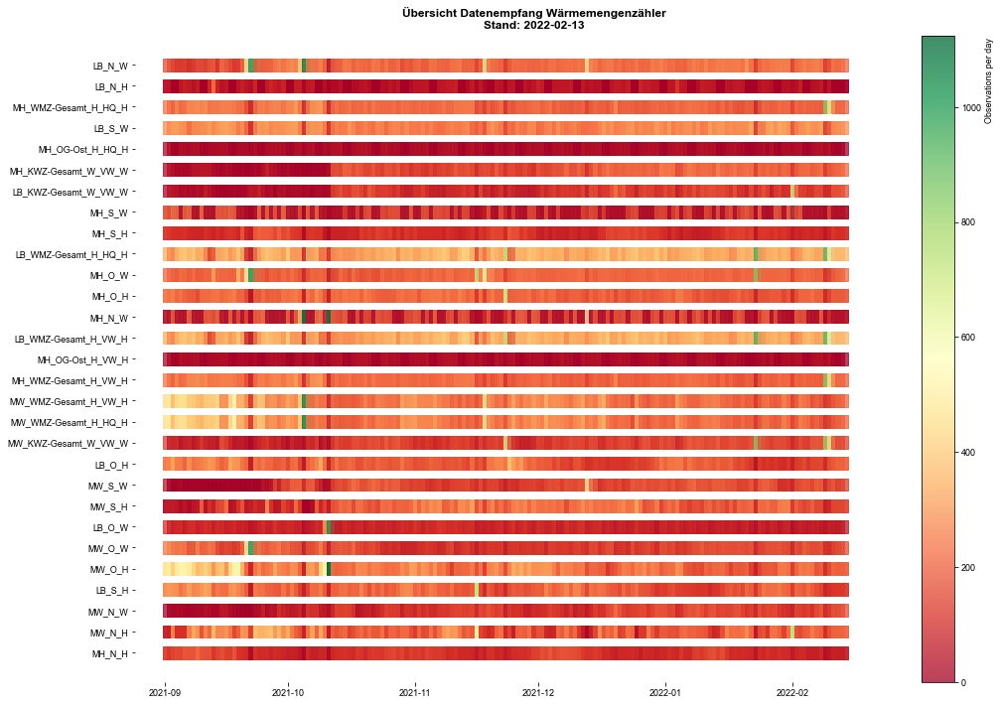

In [72]:
level_values = EM.index.get_level_values
result = EM.resample('D').count()
result = result.droplevel(level=2, axis=1)
result.columns = ['_'.join(col).strip() for col in result.columns.values]
result.T.drop_duplicates(inplace=True)
result = result.unstack().reset_index(level=0)
result.columns = ['meter', 'n_obs']
result = result.sort_index()

## plotting
f, ax = plt.subplots(figsize=(15,10))
ax.plot(result.index, result.meter, linestyle='None')
sc = ax.scatter(result.index, result.meter, c=result.n_obs, s=len(result.index.unique()), alpha=0.75,marker = 's', cmap='RdYlGn')
cbar = f.colorbar(sc)
cbar.set_label("Observations per day ", loc='top')
f.suptitle(f'Übersicht Datenempfang Wärmemengenzähler\nStand: {timemax}')
f.tight_layout()

In [ ]:

## exporting graph.
exdir = os.path.join(eb.dir_results,'Allgemein')
if not os.path.isdir(exdir):
    os.makedirs(exdir)
f.savefig(os.path.join(exdir,f'EM_Monitoring_Datenempfang_Übersicht.png'),dpi=300)
log.info(f'EnergyMeter: FINISHED')

In [ ]:
result = result.droplevel(level=3, axis=1)

result.columns

In [26]:
result = (EM.groupby([level_values(i) for i in range(3)]
                    +[pd.Grouper(freq='D', level=-1)]).size())  # count observations
result

TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'Index'

In [ ]:
result = pd.DataFrame(result, columns=['n_data'])   # make DataFrame of it
result.reset_index(level=[0,1,2],inplace=True)      # clean up DataFrame
result['meter'] = result['bui'] + '_' + result['app'] + '_' + result['type']    #clean up index
result.drop(['bui','app','type'],axis=1,inplace=True)   # remove unneeded columns

## plotting
f, ax = plt.subplots(figsize=(15,10))
ax.plot(result.index, result.meter, linestyle='None')
sc = ax.scatter(result.index, result.meter, c=result.n_data, s=len(result.index.unique()), alpha=0.75,marker = 's', cmap='RdYlGn')
cbar = f.colorbar(sc)
cbar.set_label("Observations per day ", loc='top')
f.suptitle(f'Übersicht Datenempfang Wärmemengenzähler\nStand: {timemax}')
f.tight_layout()

## exporting graph.
exdir = os.path.join(eb.dir_results,'Allgemein')
if not os.path.isdir(exdir):
    os.makedirs(exdir)
f.savefig(os.path.join(exdir,f'EM_Monitoring_Datenempfang_Übersicht.png'),dpi=300)
log.info(f'EnergyMeter: FINISHED')

## **1. Gesamtübersicht pro Raum**
---

In [ ]:
IND = {bui: sr.load_tf_bui(bui,'1min') for bui in eb.buid}

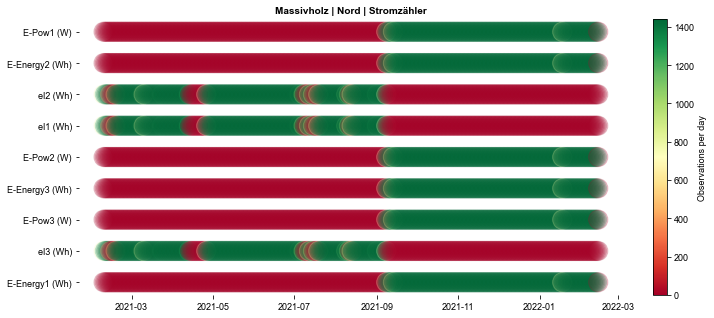

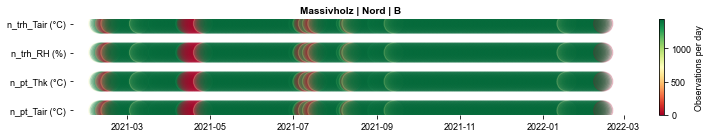

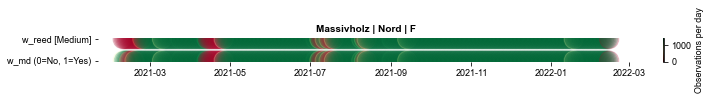

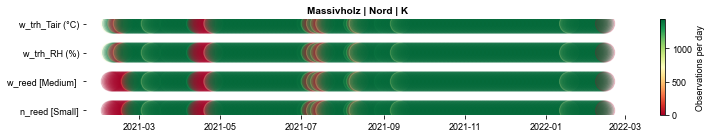

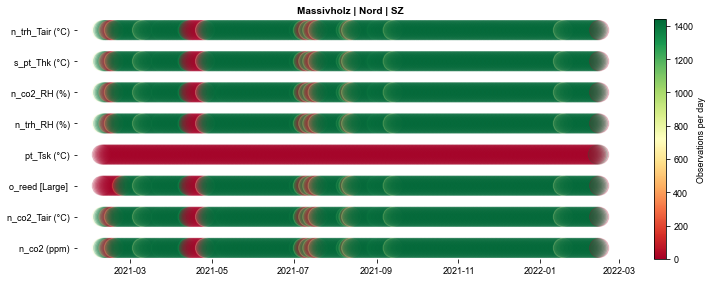

...

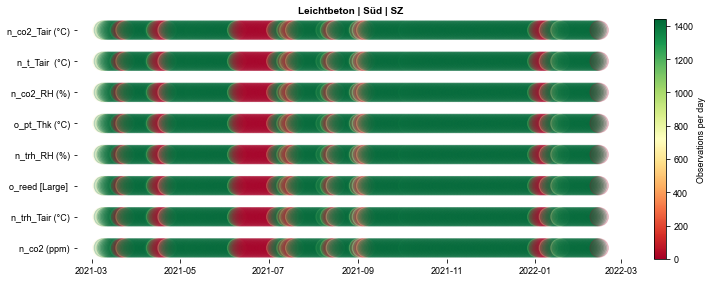

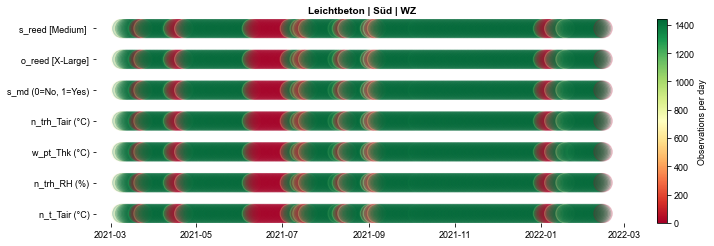

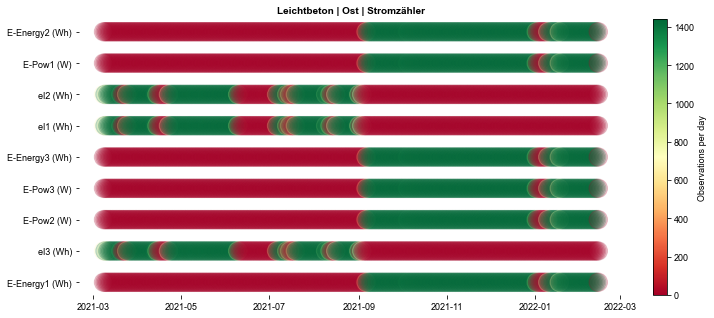

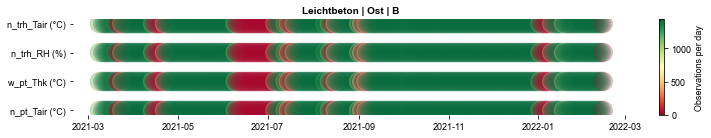

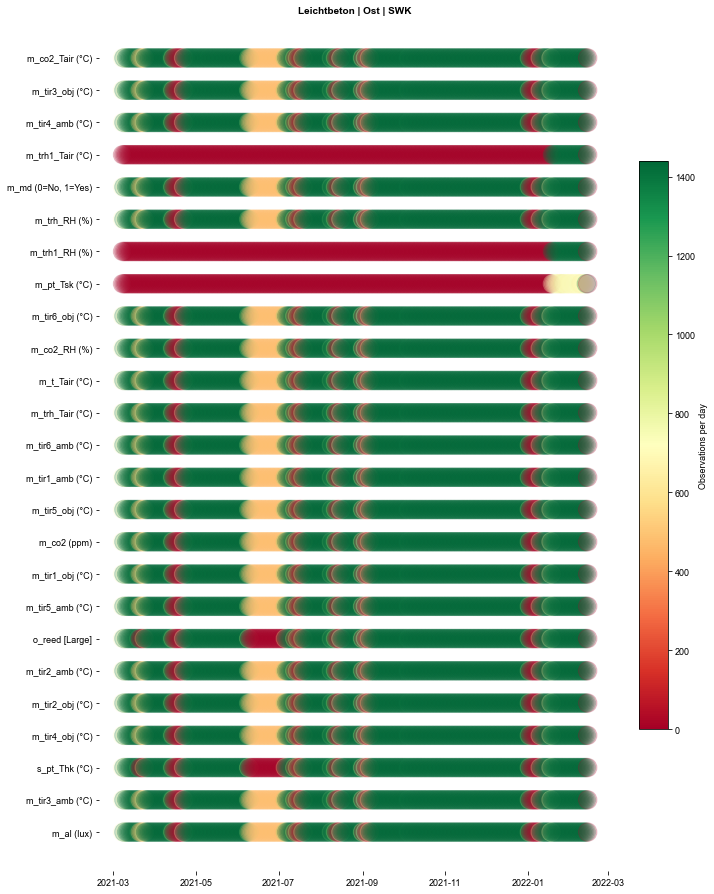

In [2]:
for bui in eb.buid:
    for app in eb.wohnungen:
        df = IND[bui][app]
        df = df.resample('D').count()
        for name, df in df.groupby(level=0,axis=1):
                if name == '': name = 'Stromzähler'
                fig,ax = plt.subplots()
                ax.set_title(f'{eb.buid[bui]} | {eb.wohnungen[app]} | {name}')
                df = df.unstack().reset_index().set_index('Datetime')
                df.columns = ['Room','Sensor_ID', 'n_data']
                df = df.sort_values(by='Sensor_ID').sort_index()
                fig.set_figheight(df.Sensor_ID.unique().size*0.5)
                sc = ax.scatter(df.index, df.Sensor_ID, c=df.n_data, s=len(df.index.unique()), alpha=0.2,marker = 'o', cmap='RdYlGn')
                ax.get_xaxis()
                #ax.set_xlim(dt.datetime.now()-dt.timedelta(1000),dt.datetime.now())
                cbar = fig.colorbar(sc,fraction=.05)
                cbar.solids.set(alpha=1)
                cbar.set_label("Observations per day")
                fig.tight_layout()
                if ex:
                    ut.export(fig,filepath=os.path.join(eb.dir_results,'Allgemein','Tinkerforge_Datenaufzeichnung'),filename=f'{bui}_{app}_{name}_Datenempfang', extlist=['pdf'], show=True)

## **2. Detaillierte Übersicht über die letzten 30 Tage**
---

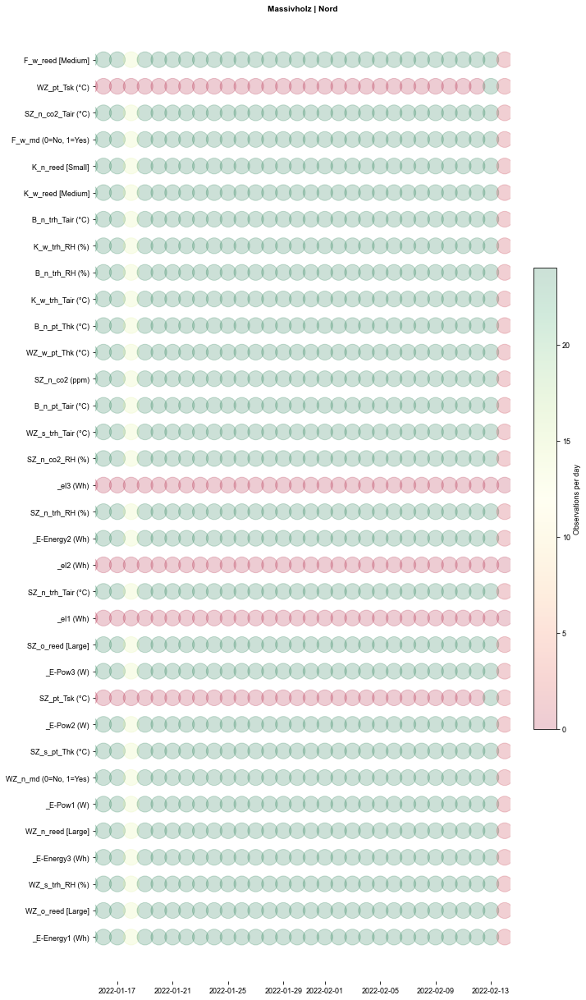

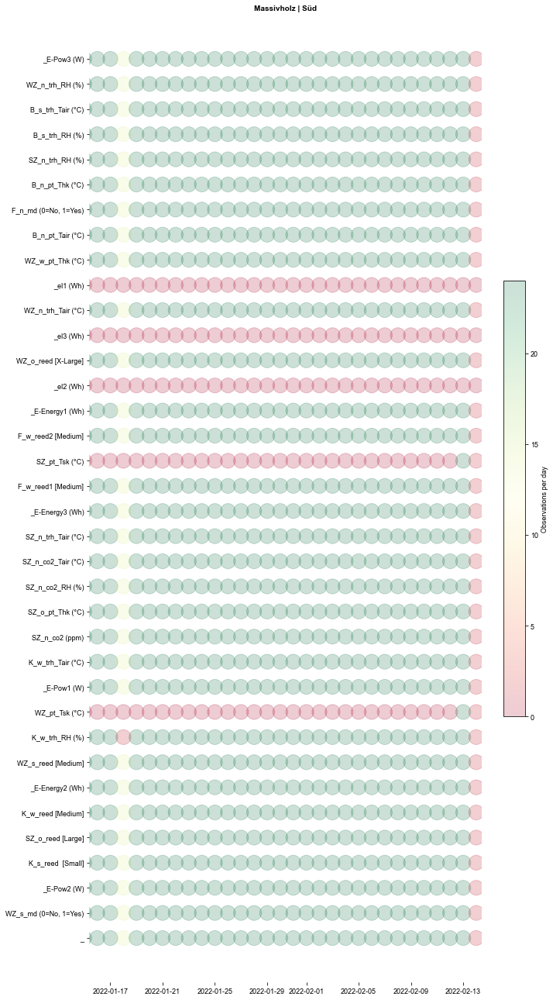

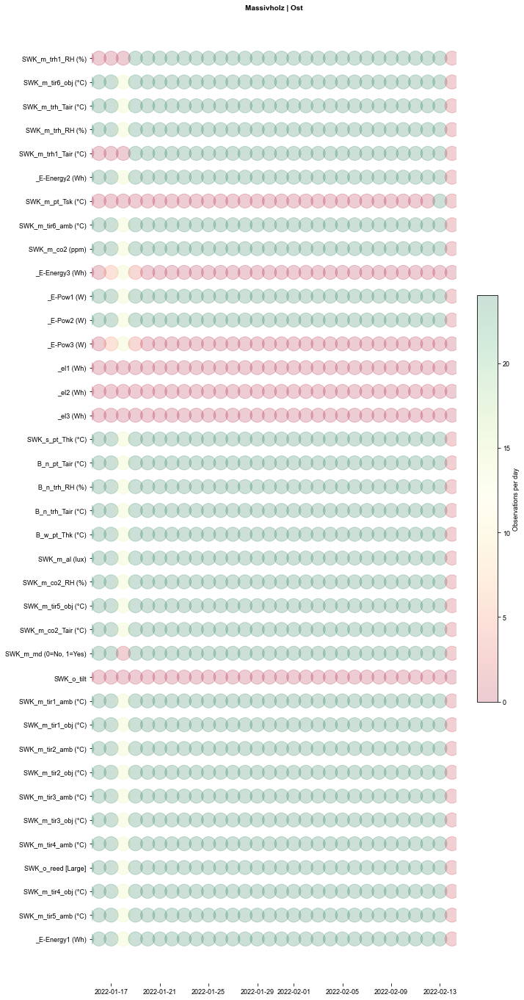

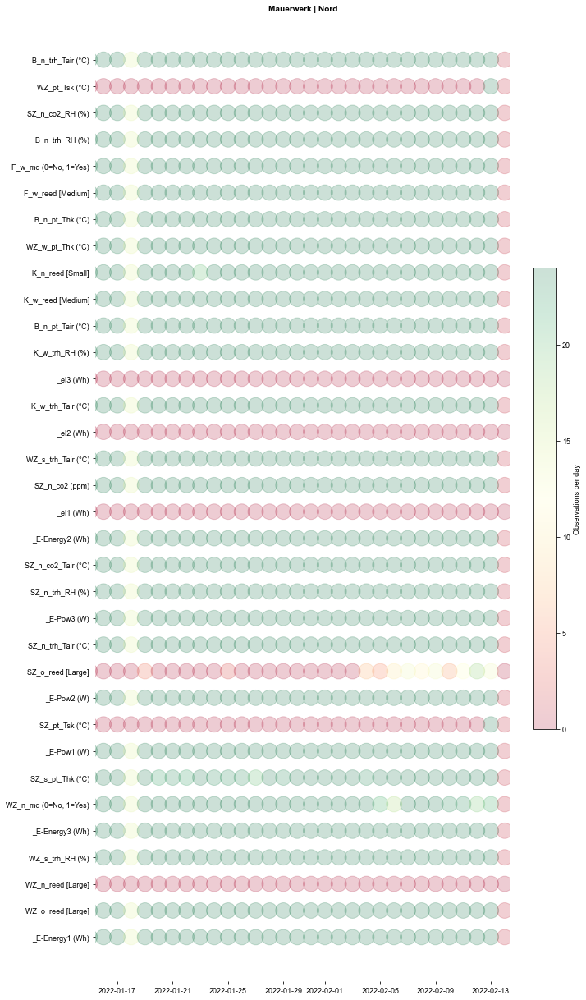

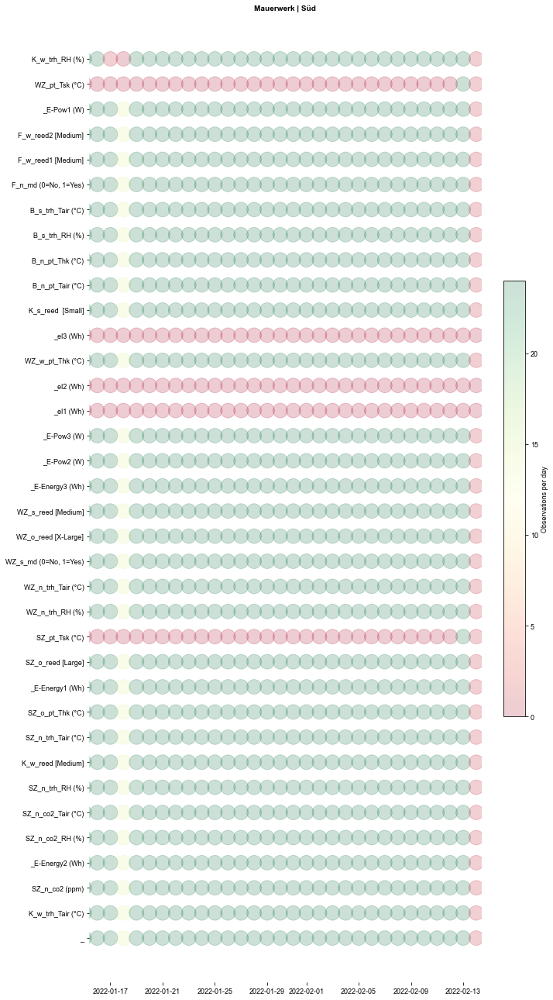

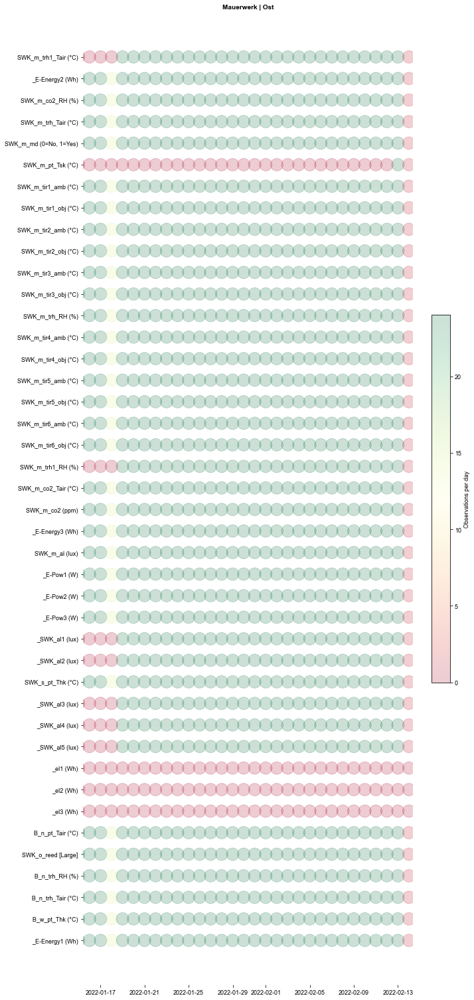

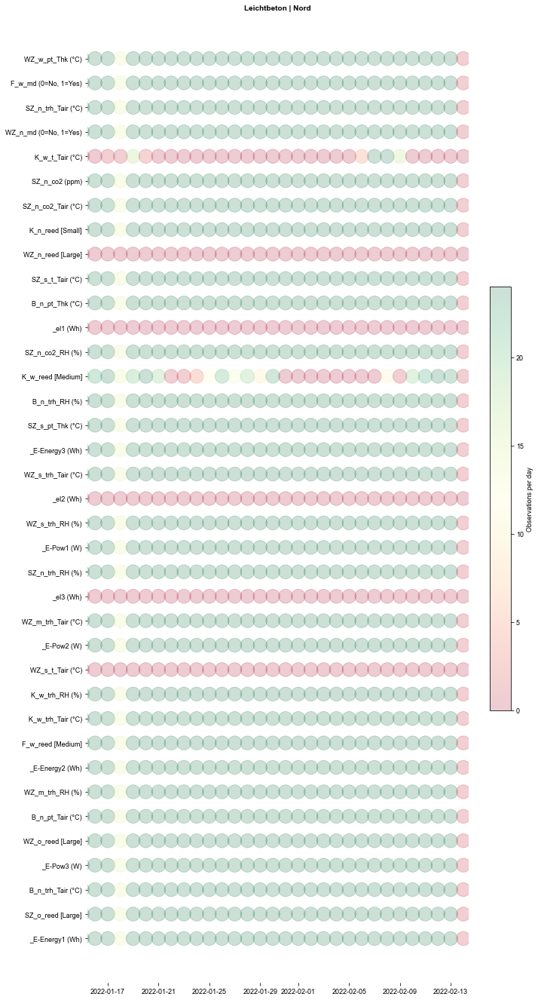

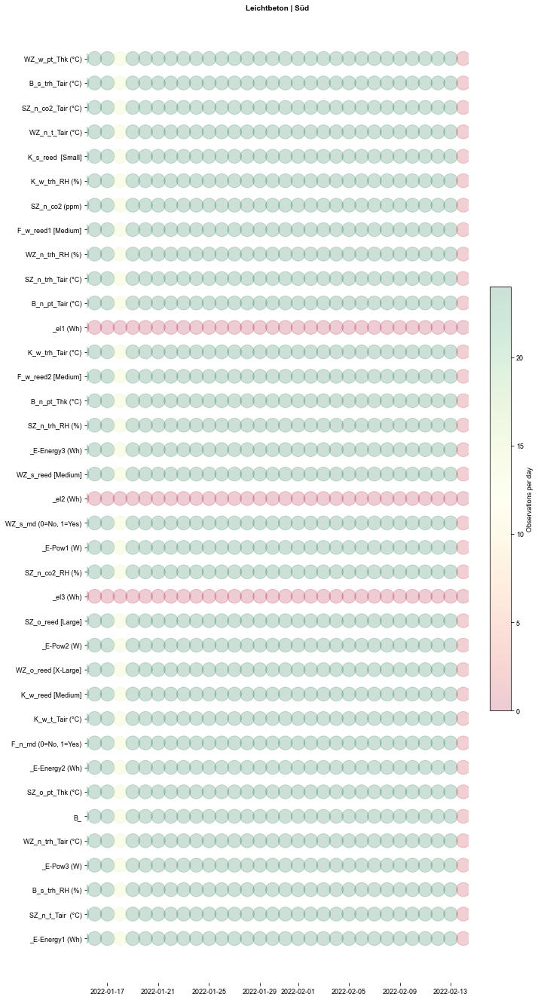

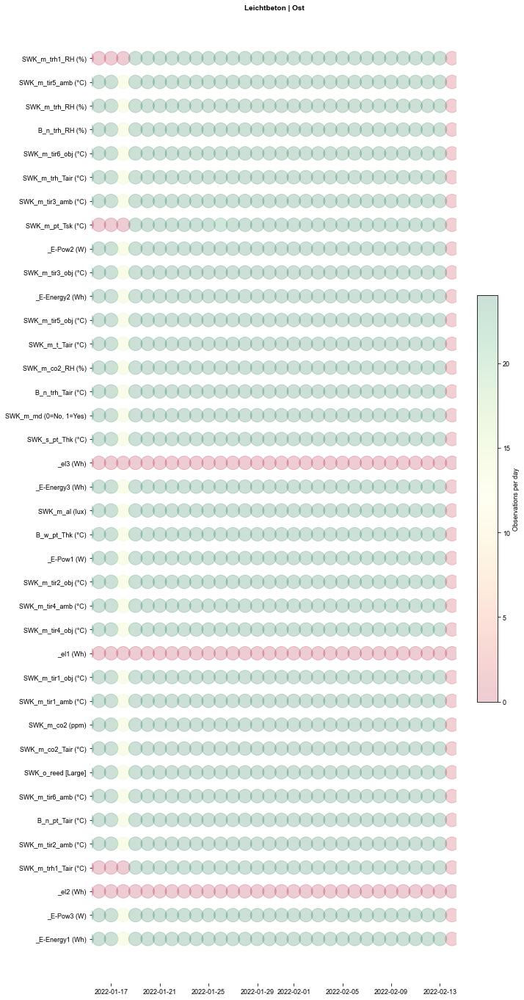

In [3]:
for bui in eb.buid:
    for app in eb.wohnungen:
        fig,ax = plt.subplots()
        ax.set_title(f'{eb.buid[bui]} | {eb.wohnungen[app]}')
        df = IND[bui][app].resample('D').count()
        df.columns = ['_'.join(col).strip() for col in df.columns.values]
        df = df.unstack().reset_index(level=0)
        df.columns = ['Sensor_ID', 'n_data']
        df.sort_index(inplace=True)
        fig.set_figheight(df.Sensor_ID.unique().size*0.5)
        sc = ax.scatter(df.index, df.Sensor_ID, c=df.n_data, s=len(df.index.unique()), alpha=0.2,marker = 'o', cmap='RdYlGn')
        ax.set_xlim(dt.datetime.now()-dt.timedelta(30),dt.datetime.now())
        cbar = fig.colorbar(sc,fraction=.05)
        cbar.set_label("Observations per day")
        fig.tight_layout()